# Land Cover Classification - Phase 2: YOLOv8-seg

This notebook implements Phase 2 of the Computer Vision course project: a YOLO-based
instance segmentation system, compared against the Phase 1 classical/U-Net baseline
on the same DeepGlobe land cover dataset.

**Model family decision: YOLOv8-seg, not YOLOv8-detect or YOLO-NAS.**

Per the Phase 2 guidelines (Section 1.3, Output-alignment decision): "If the Phase 1
project produces pixel masks and mask-level comparison is essential, select YOLOv8-seg."
Phase 1 produced per-pixel segmentation masks (U-Net, mIoU 0.6370 on DeepGlobe). Using
YOLOv8-seg keeps both systems producing mask-level output, so the Phase 1 vs Phase 2
comparison in Section 19 of this notebook is mask-to-mask, not mask-to-box.

**Model selection note (required by Section 5.1 of the guidelines):**

| Criterion | YOLOv8-seg | YOLO-NAS | Score rationale |
|---|---|---|---|
| Task compatibility | 5 | 2 | YOLO-NAS is detection-only; would force box-level comparison, breaking mask-to-mask fairness with Phase 1 |
| Annotation readiness | 4 | 2 | Both require converting DeepGlobe masks to new formats; YOLO polygon format is directly derivable from existing masks via contour extraction |
| Expected accuracy | 4 | 3 | Comparable detection backbones; segmentation head is the deciding factor here |
| Expected latency | 4 | 4 | Similar order of magnitude for *-S variants |
| Available hardware | 4 | 4 | Both run on the same dual T4 setup already in use |
| Export needs | 4 | 4 | Both support ONNX export |
| Licensing | 4 | 3 | Ultralytics AGPL-3.0 is well understood from Phase 1 tooling; SuperGradients pretrained-weight terms need separate verification |
| Maintainability | 5 | 3 | Single ecosystem (Ultralytics) already used conceptually in Phase 1 reporting style |
| Team skill / time available | 5 | 2 | Exam period in progress; Ultralytics' unified train/val/predict/export interface has the lowest implementation risk |
| **Total** | **39** | **27** | **YOLOv8-seg selected** |

YOLOv8-seg scores highest, primarily driven by task compatibility (mask output required
for fair comparison) and team skill/time available given the project's compressed timeline.

## 1. Environment Setup

In [1]:
# import subprocess, sys

# def pip(args):
#     result = subprocess.run(
#         [sys.executable, '-m', 'pip', 'install', '-q'] + args,
#         capture_output=True, text=True
#     )
#     if result.returncode != 0:
#         print(result.stderr[-500:])
#     return result.returncode

# try:
#     import numpy as _np
#     numpy_ok = tuple(int(x) for x in _np.__version__.split('.')[:2]) < (2, 0)
# except Exception:
#     numpy_ok = False

# try:
#     import ultralytics as _ul
#     ultralytics_ok = _ul.__version__ == '8.3.0'
# except Exception:
#     ultralytics_ok = False

# if numpy_ok and ultralytics_ok:
#     print(f'Environment already correct: numpy {_np.__version__}, ultralytics {_ul.__version__}')
# else:
#     print('Installing packages...')
#     pip(['numpy==1.26.4'])
#     pip(['ultralytics==8.3.0', 'opencv-python-headless>=4.8,<4.13'])
#     print('Done. Restarting kernel...')
#     from IPython import Application
#     app = Application.instance()
#     app.kernel.do_shutdown(True)

In [2]:
import os, gc, json as _json, random, shutil, time
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image
from tqdm.notebook import tqdm

import torch
from ultralytics import YOLO

os.environ['OPENCV_LOG_LEVEL'] = 'ERROR'

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
N_GPUS = torch.cuda.device_count()
print('All imports successful.')
print(f'numpy {np.__version__}, torch {torch.__version__}, device {DEVICE}')

# Disable W&B and patch broken Ray Tune callback before ultralytics loads
import os
os.environ['WANDB_DISABLED'] = 'true'
os.environ['WANDB_MODE'] = 'disabled'
os.environ['TUNE_DISABLE_AUTO_CALLBACK_LOGGERS'] = '1'

# Patch broken Ray Tune _get_session (version mismatch on Kaggle)
try:
    import ray.train._internal.session as _ray_session
    if not hasattr(_ray_session, '_get_session'):
        _ray_session._get_session = lambda: None
        print('Ray Tune patched.')
except Exception:
    pass

# Patch W&B callback directly so it never tries to init
try:
    import wandb as _wb
    _wb.init = lambda **kwargs: None
    _wb.run = True   # pretend a run already exists so wb.run or wb.init() short-circuits
    print('W&B patched.')
except Exception:
    pass


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
All imports successful.
numpy 1.26.4, torch 2.10.0+cu128, device cuda
Ray Tune patched.
W&B patched.


## 2. Configuration

Same dataset, same random seed, and the same train/val split logic as Phase 1, so
results are comparable on equivalent data.

In [3]:
class Config:
    DEEPGLOBE_DIR = Path('/kaggle/input/datasets/balraj98/deepglobe-land-cover-classification-dataset')
    WORK_DIR      = Path('/kaggle/working')
    YOLO_DATA_DIR = WORK_DIR / 'yolo_dataset'

    IMG_SIZE   = 640
    SEED       = 42
    VAL_FRAC   = 0.15

    CLASS_NAMES = ['urban_land', 'agriculture', 'rangeland', 'forest', 'water', 'barren_land']
    NUM_CLASSES = 6

    DG_COLOR_MAP = {
        (0, 255, 255): 0,
        (255, 255, 0): 1,
        (255, 0, 255): 2,
        (0, 255, 0):   3,
        (0, 0, 255):   4,
        (255, 255, 255): 5,
        (0, 0, 0):     6,
    }

    MIN_CONTOUR_AREA = 80
    EPOCHS  = 50
    PATIENCE = 20
    BATCH   = 16

CFG = Config()
CFG.YOLO_DATA_DIR.mkdir(parents=True, exist_ok=True)

## 3. Dataset Audit (Stage 2 of the implementation pipeline)

Locate source files and report the same dataset statistics required by the
guidelines: counts, class taxonomy, image quality.

In [4]:
def find_deepglobe_files(root):
    root = Path(root)
    train_dir = root / 'train'
    images = sorted(train_dir.glob('*_sat.jpg'))
    masks  = sorted(train_dir.glob('*_mask.png'))
    print(f'DeepGlobe train/ - Images: {len(images)}, Masks: {len(masks)}')
    return images, masks

dg_images, dg_masks = find_deepglobe_files(CFG.DEEPGLOBE_DIR)
assert len(dg_images) > 0, 'DeepGlobe images not found - check CFG.DEEPGLOBE_DIR'
assert len(dg_images) == len(dg_masks), 'Image/mask count mismatch'

print(f'\nTotal usable image/mask pairs: {len(dg_images)}')
print(f'Image resolution (sample): {np.array(Image.open(dg_images[0])).shape}')
print(f'Class taxonomy: {CFG.CLASS_NAMES} (Unknown/background excluded from detection classes)')

DeepGlobe train/ - Images: 803, Masks: 803

Total usable image/mask pairs: 803
Image resolution (sample): (2448, 2448, 3)
Class taxonomy: ['urban_land', 'agriculture', 'rangeland', 'forest', 'water', 'barren_land'] (Unknown/background excluded from detection classes)


## 4. Leakage-Free Split

DeepGlobe images are independent (no video frames, no bursts), so a stratified random
split is appropriate per Stage 4 of the guidelines. Same seed (42) as Phase 1 keeps
comparisons fair, though note the *split logic* differs slightly from Phase 1's
sklearn `train_test_split` - both produce an 85/15 split from the same seed, so image
membership is comparable in proportion even if exact indices differ.

In [5]:
from sklearn.model_selection import train_test_split

imgs_train, imgs_val, masks_train, masks_val = train_test_split(
    dg_images, dg_masks, test_size=CFG.VAL_FRAC, random_state=CFG.SEED
)

print(f'Train: {len(imgs_train)} images')
print(f'Val:   {len(imgs_val)} images')

# Test split: DeepGlobe's own test/ folder has no public masks, so it cannot be used
# for any labelled metric. It is reserved here only for the qualitative OOD-style
# checks already covered in the Phase 1 Gradio demo, not for Phase 2 quantitative
# scoring. The frozen quantitative test set for Phase 2 is the val split above,
# fixed before training starts and not touched for model selection.

Train: 682 images
Val:   121 images


## 5. Mask-to-Polygon Conversion (DeepGlobe masks -> YOLO segmentation format)

YOLOv8-seg requires one `.txt` label file per image, each line being:
`<class_index> <x1> <y1> <x2> <y2> ... <xn> <yn>` with coordinates normalised to
[0, 1]. DeepGlobe provides pixel-wise RGB masks, not polygons, so each class region
is extracted via contour detection and converted to one or more polygon instances.

Land cover classes are not naturally discrete countable objects (a single "Agriculture"
region can span half an image) - here each disconnected contour is treated as one
instance, which is the standard approach when adapting semantic segmentation masks to
an instance segmentation format.

In [6]:
def rgb_mask_to_class(mask_rgb, color_map):
    h, w = mask_rgb.shape[:2]
    class_mask = np.full((h, w), 6, dtype=np.uint8)
    for rgb, idx in color_map.items():
        match = np.all(mask_rgb == np.array(rgb), axis=-1)
        class_mask[match] = idx
    return class_mask


def mask_to_yolo_polygons(class_mask, num_classes, min_area=80):
    """
    Convert a single-channel class-index mask into YOLO segmentation label lines.
    Each disconnected region of a given class becomes one polygon instance.
    Class index 6 (Unknown) is excluded - it is background, not a detection target.
    """
    h, w = class_mask.shape
    lines = []

    for cls in range(num_classes):
        binary = (class_mask == cls).astype(np.uint8) * 255
        if binary.sum() == 0:
            continue

        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for contour in contours:
            area = cv2.contourArea(contour)
            if area < min_area:
                continue

            epsilon = 0.002 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)

            if len(approx) < 3:
                continue

            coords = approx.reshape(-1, 2).astype(np.float64)
            coords[:, 0] /= w
            coords[:, 1] /= h
            coords = np.clip(coords, 0.0, 1.0)

            flat = ' '.join(f'{v:.6f}' for v in coords.flatten())
            lines.append(f'{cls} {flat}')

    return lines

## 6. Build YOLO Dataset Directory Structure

In [7]:
for split in ['train', 'val']:
    (CFG.YOLO_DATA_DIR / 'images' / split).mkdir(parents=True, exist_ok=True)
    (CFG.YOLO_DATA_DIR / 'labels' / split).mkdir(parents=True, exist_ok=True)


def build_yolo_split(image_paths, mask_paths, split_name, min_area):
    img_out_dir   = CFG.YOLO_DATA_DIR / 'images' / split_name
    label_out_dir = CFG.YOLO_DATA_DIR / 'labels' / split_name

    skipped_empty = 0
    total_instances = 0

    for img_path, mask_path in tqdm(list(zip(image_paths, mask_paths)),
                                     desc=f'Building {split_name} split'):
        stem = img_path.stem.replace('_sat', '')

        shutil.copy(img_path, img_out_dir / f'{stem}.jpg')

        mask_rgb = cv2.cvtColor(cv2.imread(str(mask_path)), cv2.COLOR_BGR2RGB)
        class_mask = rgb_mask_to_class(mask_rgb, CFG.DG_COLOR_MAP)

        lines = mask_to_yolo_polygons(class_mask, CFG.NUM_CLASSES, min_area=min_area)

        if len(lines) == 0:
            skipped_empty += 1

        total_instances += len(lines)

        with open(label_out_dir / f'{stem}.txt', 'w') as f:
            f.write('\n'.join(lines))

    print(f'{split_name}: {len(image_paths)} images, {total_instances} instances, '
          f'{skipped_empty} images with no valid instances (kept as negative examples '
          f'per Stage 1.2 rule 6 - empty label files, not deleted)')


build_yolo_split(imgs_train, masks_train, 'train', CFG.MIN_CONTOUR_AREA)
build_yolo_split(imgs_val,   masks_val,   'val',   CFG.MIN_CONTOUR_AREA)

Building train split:   0%|          | 0/682 [00:00<?, ?it/s]

train: 682 images, 12224 instances, 0 images with no valid instances (kept as negative examples per Stage 1.2 rule 6 - empty label files, not deleted)


Building val split:   0%|          | 0/121 [00:00<?, ?it/s]

val: 121 images, 2566 instances, 0 images with no valid instances (kept as negative examples per Stage 1.2 rule 6 - empty label files, not deleted)


## 7. Structural and Visual Label Audit (Stage 3 requirement)

Before training, verify: no missing labels, no invalid class IDs, no out-of-bounds
coordinates, and a visual sample of rendered labels against the source image.

In [8]:
def structural_audit(split_name):
    img_dir   = CFG.YOLO_DATA_DIR / 'images' / split_name
    label_dir = CFG.YOLO_DATA_DIR / 'labels' / split_name

    img_stems   = {p.stem for p in img_dir.glob('*.jpg')}
    label_stems = {p.stem for p in label_dir.glob('*.txt')}

    missing_labels = img_stems - label_stems
    orphan_labels  = label_stems - img_stems

    invalid_class_count = 0
    out_of_bounds_count = 0
    zero_point_count    = 0

    for label_path in label_dir.glob('*.txt'):
        with open(label_path) as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                parts = line.split()
                cls = int(parts[0])
                coords = list(map(float, parts[1:]))

                if cls < 0 or cls >= CFG.NUM_CLASSES:
                    invalid_class_count += 1
                if any(c < 0.0 or c > 1.0 for c in coords):
                    out_of_bounds_count += 1
                if len(coords) < 6:
                    zero_point_count += 1

    print(f'--- {split_name} structural audit ---')
    print(f'  Missing label files: {len(missing_labels)}')
    print(f'  Orphan label files (no matching image): {len(orphan_labels)}')
    print(f'  Invalid class IDs: {invalid_class_count}')
    print(f'  Out-of-bounds coordinates: {out_of_bounds_count}')
    print(f'  Degenerate polygons (<3 points): {zero_point_count}')

    assert len(missing_labels) == 0, 'Structural audit failed: missing labels'
    assert invalid_class_count == 0, 'Structural audit failed: invalid class IDs'
    assert out_of_bounds_count == 0, 'Structural audit failed: out-of-bounds coordinates'

structural_audit('train')
structural_audit('val')
print('\nStructural audit passed for both splits.')

--- train structural audit ---
  Missing label files: 0
  Orphan label files (no matching image): 0
  Invalid class IDs: 0
  Out-of-bounds coordinates: 0
  Degenerate polygons (<3 points): 0
--- val structural audit ---
  Missing label files: 0
  Orphan label files (no matching image): 0
  Invalid class IDs: 0
  Out-of-bounds coordinates: 0
  Degenerate polygons (<3 points): 0

Structural audit passed for both splits.


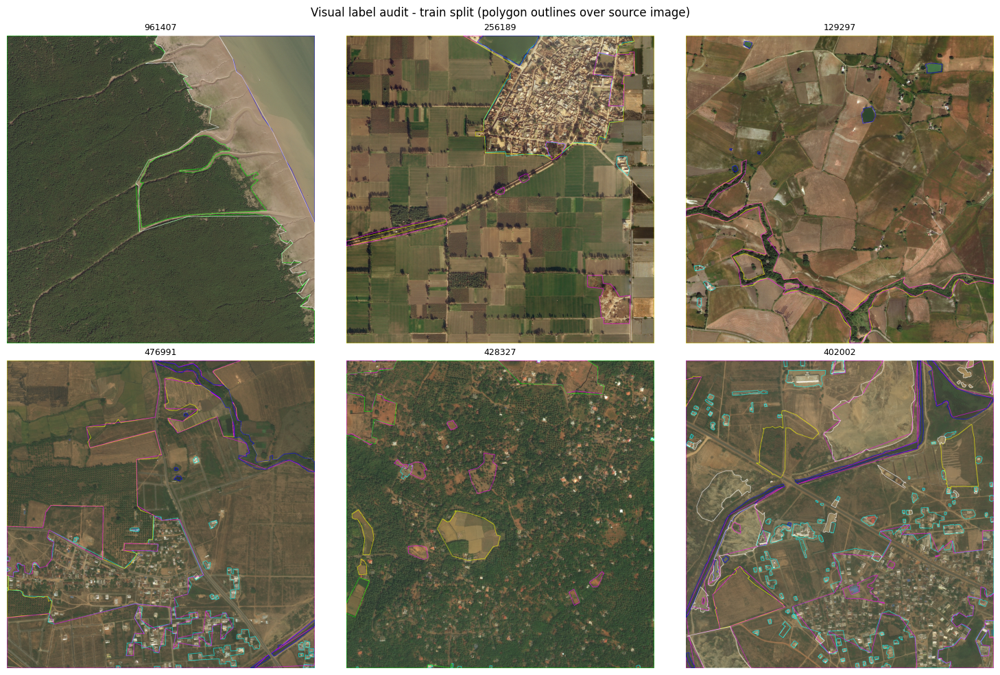

In [9]:
def visual_audit(split_name, n_samples=6):
    img_dir   = CFG.YOLO_DATA_DIR / 'images' / split_name
    label_dir = CFG.YOLO_DATA_DIR / 'labels' / split_name

    colours = [(0,255,255), (255,255,0), (255,0,255), (0,255,0), (0,0,255), (255,255,255)]

    img_paths = sorted(img_dir.glob('*.jpg'))
    sample = random.sample(img_paths, min(n_samples, len(img_paths)))

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for ax, img_path in zip(axes, sample):
        img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        overlay = img.copy()

        label_path = label_dir / f'{img_path.stem}.txt'
        with open(label_path) as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                parts = line.split()
                cls = int(parts[0])
                coords = np.array(list(map(float, parts[1:]))).reshape(-1, 2)
                coords[:, 0] *= w
                coords[:, 1] *= h
                pts = coords.astype(np.int32)
                cv2.polylines(overlay, [pts], isClosed=True, color=colours[cls], thickness=2)

        ax.imshow(overlay)
        ax.set_title(img_path.stem, fontsize=9)
        ax.axis('off')

    plt.suptitle(f'Visual label audit - {split_name} split (polygon outlines over source image)',
                 fontsize=12)
    plt.tight_layout()
    plt.show()

visual_audit('train')

## 8. Object Statistics (Stage 2 requirement)

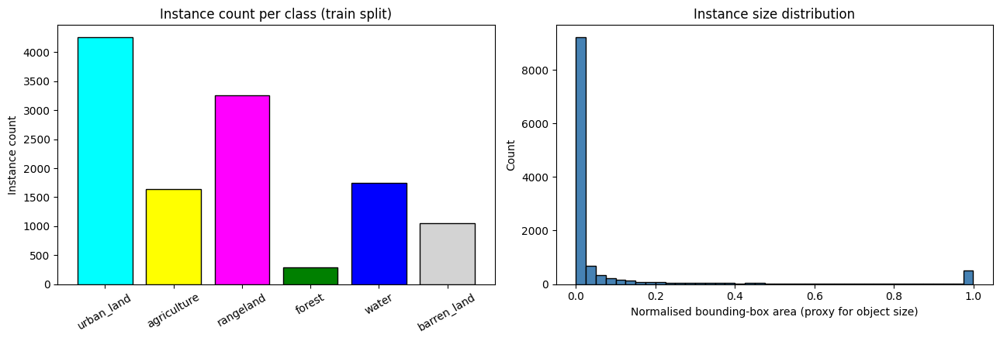

Instance counts per class:
  urban_land    : 4257
  agriculture   : 1642
  rangeland     : 3251
  forest        : 289
  water         : 1740
  barren_land   : 1045

Median instance area (normalised): 0.0037
Note: land cover classes naturally produce large, irregular instances rather than small countable objects - this differs from typical YOLO use cases (e.g. cars, people) and is itself a relevant point for the methodology discussion.


In [10]:
def collect_instance_stats(split_name):
    label_dir = CFG.YOLO_DATA_DIR / 'labels' / split_name
    class_counts = np.zeros(CFG.NUM_CLASSES, dtype=int)
    areas = []

    for label_path in label_dir.glob('*.txt'):
        with open(label_path) as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                parts = line.split()
                cls = int(parts[0])
                coords = np.array(list(map(float, parts[1:]))).reshape(-1, 2)
                class_counts[cls] += 1

                x_range = coords[:, 0].max() - coords[:, 0].min()
                y_range = coords[:, 1].max() - coords[:, 1].min()
                areas.append(x_range * y_range)

    return class_counts, np.array(areas)

train_counts, train_areas = collect_instance_stats('train')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 4.5))

ax1.bar(CFG.CLASS_NAMES, train_counts, color=['cyan','yellow','magenta','green','blue','lightgray'],
       edgecolor='black')
ax1.set_ylabel('Instance count')
ax1.set_title('Instance count per class (train split)')
ax1.tick_params(axis='x', rotation=30)

ax2.hist(train_areas, bins=40, color='steelblue', edgecolor='black')
ax2.set_xlabel('Normalised bounding-box area (proxy for object size)')
ax2.set_ylabel('Count')
ax2.set_title('Instance size distribution')

plt.tight_layout()
plt.show()

print('Instance counts per class:')
for name, count in zip(CFG.CLASS_NAMES, train_counts):
    print(f'  {name:<14}: {count}')
print(f'\nMedian instance area (normalised): {np.median(train_areas):.4f}')
print('Note: land cover classes naturally produce large, irregular instances rather '
      'than small countable objects - this differs from typical YOLO use cases (e.g. '
      'cars, people) and is itself a relevant point for the methodology discussion.')

## 9. Dataset YAML Configuration

In [11]:
data_yaml_content = f"""\
path: {CFG.YOLO_DATA_DIR}
train: images/train
val: images/val

names:
  0: urban_land
  1: agriculture
  2: rangeland
  3: forest
  4: water
  5: barren_land
"""

data_yaml_path = CFG.YOLO_DATA_DIR / 'data.yaml'
with open(data_yaml_path, 'w') as f:
    f.write(data_yaml_content)

print(data_yaml_content)
print(f'Saved to {data_yaml_path}')

path: /kaggle/working/yolo_dataset
train: images/train
val: images/val

names:
  0: urban_land
  1: agriculture
  2: rangeland
  3: forest
  4: water
  5: barren_land

Saved to /kaggle/working/yolo_dataset/data.yaml


## 10. Experiment E0 - Reproducible Baseline

Default small segmentation model, fixed seed, pretrained weights, no augmentation
changes from Ultralytics defaults. This is the controlled reference point all later
experiments are compared against.

In [18]:
# Create empty wb.py replacement so Ultralytics can import it without crashing
wb_path = '/usr/local/lib/python3.12/dist-packages/ultralytics/utils/callbacks/wb.py'
with open(wb_path, 'w') as f:
    f.write('callbacks = {}\n')

model_e0 = YOLO('yolov8s-seg.pt')
start_time = time.time()

results_e0 = model_e0.train(
    data=str(data_yaml_path),
    epochs=CFG.EPOCHS,
    imgsz=CFG.IMG_SIZE,
    batch=CFG.BATCH,
    patience=CFG.PATIENCE,
    seed=CFG.SEED,
    project='land_cover_phase2',
    name='E0_baseline_yolov8s',
    exist_ok=True,
)

e0_train_time = time.time() - start_time
print(f'E0 training time: {e0_train_time/60:.1f} minutes')
print(f'Peak GPU memory: {torch.cuda.max_memory_allocated()/1e9:.2f} GB')

New https://pypi.org/project/ultralytics/8.4.90 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/working/yolo_dataset/data.yaml, epochs=50, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=land_cover_phase2, name=E0_baseline_yolov8s, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=

train: Scanning /kaggle/working/yolo_dataset/labels/train.cache... 682 images, 0 backgrounds, 0 corrupt: 100%|██████████| 682/682 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]


Plotting labels to land_cover_phase2/E0_baseline_yolov8s/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 72 weight(decay=0.0), 83 weight(decay=0.0005), 82 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to land_cover_phase2/E0_baseline_yolov8s
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.52G      1.622      4.169      3.563      1.575        327        640: 100%|██████████| 43/43 [00:45<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        121       2566     0.0233      0.244     0.0589     0.0272     0.0145      0.168     0.0392     0.0126



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.52G      1.572       3.53      2.765      1.518        222        640: 100%|██████████| 43/43 [00:44<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.57it/s]

                   all        121       2566     0.0155      0.306     0.0549     0.0248     0.0106      0.182     0.0239    0.00783



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.48G      1.539       3.44      2.383      1.498        170        640: 100%|██████████| 43/43 [00:44<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

                   all        121       2566      0.197      0.103     0.0718     0.0292      0.184     0.0805     0.0607     0.0223



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.31G      1.533      3.434      2.244      1.486        253        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]

                   all        121       2566      0.282      0.176       0.15     0.0775      0.241       0.14      0.103     0.0391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.93G      1.476      3.361      2.152      1.455        212        640: 100%|██████████| 43/43 [00:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]

                   all        121       2566      0.231      0.181      0.139     0.0727      0.254      0.156      0.123     0.0539



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.86G      1.477      3.314       2.06      1.447        253        640: 100%|██████████| 43/43 [00:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.18it/s]

                   all        121       2566      0.262       0.24      0.167      0.082      0.252      0.228      0.152     0.0639



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.84G      1.413      3.248      1.989      1.424        179        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.21it/s]

                   all        121       2566      0.243      0.224      0.173     0.0886      0.246      0.218      0.161     0.0669



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.52G       1.43      3.207      1.989      1.429        229        640: 100%|██████████| 43/43 [00:44<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

                   all        121       2566      0.369      0.256      0.225      0.125      0.373      0.236      0.208     0.0965



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.05G        1.4      3.171      1.951      1.406        226        640: 100%|██████████| 43/43 [00:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]

                   all        121       2566      0.352      0.258      0.219      0.121      0.378      0.241      0.204     0.0943



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.27G      1.374      3.147      1.904      1.399        351        640: 100%|██████████| 43/43 [00:44<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.34it/s]

                   all        121       2566      0.304      0.299      0.219      0.126      0.292       0.27      0.197     0.0916



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.95G      1.361      3.076      1.873      1.388        209        640: 100%|██████████| 43/43 [00:42<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        121       2566      0.325      0.276      0.219      0.124      0.307       0.26      0.199     0.0929



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.87G      1.354      3.071       1.85      1.379        265        640: 100%|██████████| 43/43 [00:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all        121       2566      0.294      0.288      0.213      0.116      0.299      0.263      0.194     0.0891



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.46G      1.326       3.04      1.818      1.367        201        640: 100%|██████████| 43/43 [00:42<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]

                   all        121       2566      0.389      0.278      0.233      0.132      0.406      0.251      0.225      0.105



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.71G      1.328      3.001      1.781      1.364        288        640: 100%|██████████| 43/43 [00:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]

                   all        121       2566      0.326      0.311      0.236      0.125      0.329      0.285      0.211     0.0962



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.12G       1.32      2.954       1.77      1.356        225        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.48it/s]

                   all        121       2566       0.37      0.306      0.259       0.14      0.413       0.27      0.244      0.109



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.83G      1.304       2.94      1.722      1.347        205        640: 100%|██████████| 43/43 [00:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        121       2566      0.382      0.298      0.256      0.145       0.38      0.254      0.227      0.107



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50       6.5G      1.298      2.906      1.702      1.342        323        640: 100%|██████████| 43/43 [00:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all        121       2566      0.439      0.311      0.288      0.159      0.448      0.303      0.271      0.127



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.79G       1.29      2.887      1.693      1.337        266        640: 100%|██████████| 43/43 [00:44<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        121       2566      0.436      0.294       0.29      0.172      0.422      0.288      0.267      0.128



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50       6.8G      1.272       2.83      1.648      1.321        223        640: 100%|██████████| 43/43 [00:42<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]

                   all        121       2566      0.411      0.297       0.28      0.166      0.411      0.282      0.257      0.125



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.84G      1.289      2.847      1.642      1.335        298        640: 100%|██████████| 43/43 [00:45<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]

                   all        121       2566       0.47      0.316       0.32      0.184      0.456      0.303      0.289      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.48G      1.253      2.779       1.63      1.314        223        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.53it/s]

                   all        121       2566      0.441      0.338      0.313      0.189      0.449      0.301      0.284      0.144



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.66G       1.26      2.808      1.641      1.322        346        640: 100%|██████████| 43/43 [00:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        121       2566      0.408      0.321      0.296       0.17      0.403       0.31      0.279      0.129



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.58G      1.237      2.755      1.565      1.297        402        640: 100%|██████████| 43/43 [00:44<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.59it/s]

                   all        121       2566      0.432      0.322      0.294      0.172      0.424      0.318      0.281      0.136



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.17G      1.246      2.743      1.567      1.301        261        640: 100%|██████████| 43/43 [00:44<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all        121       2566       0.42      0.337      0.302       0.17      0.461      0.309      0.283      0.135



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50       7.1G      1.234      2.721       1.56      1.297        212        640: 100%|██████████| 43/43 [00:44<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.24it/s]

                   all        121       2566      0.482      0.333      0.321      0.192       0.48      0.324        0.3      0.145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      6.48G      1.214      2.682      1.548       1.29        303        640: 100%|██████████| 43/43 [00:45<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.47it/s]

                   all        121       2566      0.408      0.332      0.297      0.172      0.425      0.318      0.283      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.78G      1.216      2.681      1.519      1.285        290        640: 100%|██████████| 43/43 [00:46<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        121       2566      0.405      0.334      0.307      0.183      0.424      0.296      0.287      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.81G      1.207      2.676      1.506      1.274        313        640: 100%|██████████| 43/43 [00:44<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.18it/s]

                   all        121       2566      0.424      0.309      0.307      0.183      0.423      0.301      0.283       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.81G      1.192      2.606      1.475      1.267        182        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]

                   all        121       2566      0.476      0.335      0.338      0.202      0.442      0.312      0.305      0.157



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.76G      1.188      2.629      1.469      1.257        548        640: 100%|██████████| 43/43 [00:45<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        121       2566      0.456      0.322      0.312      0.181      0.446      0.314       0.29      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.78G      1.186      2.585      1.476      1.274        300        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all        121       2566      0.442      0.356      0.315      0.184      0.403      0.322      0.276      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.04G      1.174      2.556      1.421      1.263        500        640: 100%|██████████| 43/43 [00:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]

                   all        121       2566       0.45      0.365      0.336      0.199      0.438      0.348      0.316       0.16



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.94G      1.164      2.529      1.417      1.245        203        640: 100%|██████████| 43/43 [00:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        121       2566      0.428       0.36      0.328      0.197      0.436      0.337      0.306      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.27G      1.147      2.516      1.378      1.237        215        640: 100%|██████████| 43/43 [00:42<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]

                   all        121       2566      0.479      0.335      0.327      0.199      0.464      0.326      0.303      0.155



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.65G      1.149      2.481      1.348       1.22        363        640: 100%|██████████| 43/43 [00:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all        121       2566      0.422      0.348      0.318      0.187      0.373      0.347      0.293      0.144



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.01G      1.139      2.474      1.366       1.23        344        640: 100%|██████████| 43/43 [00:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        121       2566      0.445      0.354      0.329      0.195      0.456      0.342      0.309      0.155



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.77G      1.142      2.478      1.357      1.239        308        640: 100%|██████████| 43/43 [00:42<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all        121       2566      0.413      0.373      0.326      0.191      0.441      0.337      0.302      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.04G      1.126      2.455      1.323      1.226        297        640: 100%|██████████| 43/43 [00:42<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.58it/s]

                   all        121       2566      0.407       0.35      0.304      0.174       0.39      0.335      0.278      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.81G       1.12      2.434      1.328      1.219        194        640: 100%|██████████| 43/43 [00:46<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all        121       2566       0.44      0.366      0.323      0.194       0.43      0.336      0.298      0.146



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.09G      1.104      2.425      1.306      1.206        219        640: 100%|██████████| 43/43 [00:45<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all        121       2566      0.469      0.362      0.346      0.205      0.467      0.349      0.323      0.158


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.98G       1.31      2.592      1.708      1.318         92        640: 100%|██████████| 43/43 [00:37<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        121       2566      0.422      0.384      0.326      0.192      0.396      0.357      0.297      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.39G      1.265      2.476      1.543      1.288        111        640: 100%|██████████| 43/43 [00:33<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.34it/s]

                   all        121       2566      0.497      0.347      0.346      0.207      0.501      0.327      0.321       0.16



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.32G       1.24       2.45      1.489      1.276        145        640: 100%|██████████| 43/43 [00:34<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all        121       2566      0.495      0.364       0.35      0.204      0.481      0.347      0.331      0.159



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.35G      1.215      2.417      1.445       1.26        190        640: 100%|██████████| 43/43 [00:34<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.45it/s]

                   all        121       2566      0.501      0.362      0.355      0.205      0.484      0.341      0.328      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.91G      1.203      2.368      1.419      1.255        218        640: 100%|██████████| 43/43 [00:34<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]

                   all        121       2566      0.485      0.369      0.348      0.201      0.472      0.357      0.318      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.87G      1.197      2.343      1.406      1.244        108        640: 100%|██████████| 43/43 [00:34<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

                   all        121       2566      0.432      0.393       0.34      0.193      0.453      0.342      0.313      0.147



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.96G       1.19      2.316       1.39      1.247        180        640: 100%|██████████| 43/43 [00:35<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        121       2566      0.493      0.359      0.357      0.208      0.489      0.329      0.323      0.159



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.17G       1.18      2.305      1.359      1.227        181        640: 100%|██████████| 43/43 [00:33<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]

                   all        121       2566      0.492      0.365      0.355      0.209      0.501      0.337      0.328      0.162



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.24G      1.167      2.288      1.344      1.228        259        640: 100%|██████████| 43/43 [00:33<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]

                   all        121       2566      0.488      0.371      0.353      0.208      0.481      0.335      0.322       0.16



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.04G      1.167      2.287      1.347       1.22        216        640: 100%|██████████| 43/43 [00:34<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.39it/s]

                   all        121       2566      0.483      0.375      0.352      0.206      0.453      0.361      0.325      0.162



50 epochs completed in 0.655 hours.
Optimizer stripped from land_cover_phase2/E0_baseline_yolov8s/weights/last.pt, 21.3MB
Optimizer stripped from land_cover_phase2/E0_baseline_yolov8s/weights/best.pt, 21.3MB

Validating land_cover_phase2/E0_baseline_yolov8s/weights/best.pt...
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8s-seg summary (fused): 213 layers, 10,484,002 parameters, 0 gradients, 34.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.11s/it]


                   all        121       2566      0.492      0.365      0.356      0.209      0.499      0.336      0.327      0.162
            urban_land         98        954      0.454       0.35      0.335      0.165      0.481       0.33      0.322      0.129
           agriculture        109        278      0.611      0.457      0.481      0.331      0.604      0.411       0.43      0.248
             rangeland         75        667       0.46      0.309      0.299      0.163      0.493      0.301      0.294       0.14
                forest         23         42      0.551      0.476      0.421      0.251      0.532      0.429      0.395      0.198
                 water         75        362      0.497      0.413      0.397      0.239      0.494      0.378      0.357      0.184
           barren_land         75        263      0.379      0.183        0.2      0.106      0.392      0.167      0.167     0.0755
Speed: 0.4ms preprocess, 7.6ms inference, 0.0ms loss, 5.6ms postproce

## 11. Experiment E1 - Data-Focused Improvement

One controlled change from E0: class-balanced handling via Ultralytics' built-in
`copy_paste` and `mixup` augmentations, targeting the Rangeland minority/confusion
class identified as the weakest class in the Phase 1 U-Net baseline (IoU 0.348).
Domain-relevant augmentation (rotation, since satellite imagery has no canonical
up/down orientation) is also enabled. Everything else matches E0.

In [19]:
wb_path = '/usr/local/lib/python3.12/dist-packages/ultralytics/utils/callbacks/wb.py'
with open(wb_path, 'w') as f:
    f.write('callbacks = {}\n')

model_e1 = YOLO('yolov8s-seg.pt')

start_time = time.time()

results_e1 = model_e1.train(
    data=str(data_yaml_path),
    epochs=CFG.EPOCHS,
    imgsz=CFG.IMG_SIZE,
    batch=CFG.BATCH,
    patience=CFG.PATIENCE,
    seed=CFG.SEED,
    project='land_cover_phase2',
    name='E1_data_augmentation',
    exist_ok=True,
    degrees=180,
    copy_paste=0.3,
    mixup=0.15,
)

e1_train_time = time.time() - start_time
print(f'\nE1 training time: {e1_train_time/60:.1f} minutes')

New https://pypi.org/project/ultralytics/8.4.90 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/working/yolo_dataset/data.yaml, epochs=50, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=land_cover_phase2, name=E1_data_augmentation, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks

train: Scanning /kaggle/working/yolo_dataset/labels/train.cache... 682 images, 0 backgrounds, 0 corrupt: 100%|██████████| 682/682 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]


Plotting labels to land_cover_phase2/E1_data_augmentation/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 72 weight(decay=0.0), 83 weight(decay=0.0005), 82 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to land_cover_phase2/E1_data_augmentation
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.51G      2.019      4.321      3.712      1.881        313        640: 100%|██████████| 43/43 [01:01<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]

                   all        121       2566     0.0153      0.261     0.0459     0.0219     0.0068      0.144     0.0128    0.00417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.58G      1.919      3.745      3.016      1.743        340        640: 100%|██████████| 43/43 [01:01<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]

                   all        121       2566      0.015      0.301     0.0394     0.0146    0.00913      0.187     0.0139    0.00405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.03G      1.911      3.676      2.687      1.755        316        640: 100%|██████████| 43/43 [01:00<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]

                   all        121       2566     0.0974      0.146     0.0404     0.0162      0.083     0.0791     0.0284     0.0105



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.59G      1.851      3.602      2.495      1.721        339        640: 100%|██████████| 43/43 [00:59<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.21it/s]

                   all        121       2566      0.226      0.212      0.139     0.0655      0.196      0.177      0.108     0.0445



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.93G      1.839      3.604      2.436      1.717        408        640: 100%|██████████| 43/43 [00:58<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]

                   all        121       2566      0.224      0.221      0.137     0.0616      0.188      0.182     0.0999     0.0386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      9.56G      1.784      3.531      2.337      1.679        324        640: 100%|██████████| 43/43 [00:57<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]

                   all        121       2566      0.297      0.216      0.164     0.0729       0.28      0.195      0.138     0.0562



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.27G      1.741      3.429      2.275      1.638        285        640: 100%|██████████| 43/43 [01:00<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.27it/s]

                   all        121       2566      0.364      0.239      0.215       0.12      0.354      0.219      0.192     0.0851



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50       7.6G       1.74      3.473       2.27      1.667        376        640: 100%|██████████| 43/43 [00:57<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]

                   all        121       2566      0.286      0.283      0.199     0.0938      0.265      0.248       0.17      0.071



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.74G      1.725      3.414      2.219      1.636        453        640: 100%|██████████| 43/43 [00:58<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.31it/s]

                   all        121       2566      0.334      0.299      0.219      0.117      0.308      0.287      0.201     0.0905



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.24G       1.69      3.336      2.164      1.615        260        640: 100%|██████████| 43/43 [00:56<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.17it/s]

                   all        121       2566      0.325      0.279      0.222      0.125      0.323      0.248      0.199     0.0817



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.19G      1.714      3.367      2.143      1.623        273        640: 100%|██████████| 43/43 [00:58<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]

                   all        121       2566      0.288      0.304      0.211      0.114      0.267       0.29      0.196     0.0878



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.58G      1.658      3.304       2.11      1.591        277        640: 100%|██████████| 43/43 [00:59<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]

                   all        121       2566      0.354      0.281      0.241      0.134      0.377      0.283      0.235      0.116



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.04G      1.643      3.261      2.091      1.584        298        640: 100%|██████████| 43/43 [00:58<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.34it/s]

                   all        121       2566      0.386      0.281      0.232      0.129      0.417      0.268      0.222      0.104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.72G      1.689      3.314      2.096      1.596        274        640: 100%|██████████| 43/43 [01:00<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]

                   all        121       2566      0.403       0.27      0.242      0.145      0.407      0.265       0.23      0.108



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.19G      1.637      3.242      2.058      1.576        421        640: 100%|██████████| 43/43 [00:58<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.17it/s]

                   all        121       2566      0.345       0.29      0.242      0.135      0.341      0.281      0.228      0.107



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.91G      1.641      3.243      2.058       1.57        397        640: 100%|██████████| 43/43 [00:57<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]

                   all        121       2566      0.409      0.245      0.246      0.149      0.406       0.24       0.23      0.113



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.95G        1.6      3.163      2.029      1.565        398        640: 100%|██████████| 43/43 [00:56<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

                   all        121       2566      0.369       0.27      0.246      0.143      0.359       0.26      0.233      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.87G      1.632      3.238      2.049       1.58        330        640: 100%|██████████| 43/43 [00:59<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]

                   all        121       2566      0.366      0.303      0.245      0.143      0.371      0.292      0.237      0.113



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.56G      1.617      3.177      1.984      1.554        288        640: 100%|██████████| 43/43 [00:56<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        121       2566       0.42      0.284      0.278      0.165      0.397      0.296      0.267      0.134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.43G      1.641      3.209      2.024      1.576        344        640: 100%|██████████| 43/43 [00:58<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]

                   all        121       2566      0.415      0.308      0.273      0.167      0.402      0.283      0.255      0.126



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.69G      1.596      3.117      1.979      1.541        292        640: 100%|██████████| 43/43 [00:57<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        121       2566       0.42      0.292      0.281      0.173      0.417      0.293      0.266      0.134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.63G       1.57      3.127       1.95      1.535        288        640: 100%|██████████| 43/43 [00:54<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        121       2566      0.338      0.311      0.246      0.137      0.348       0.29      0.233      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.98G      1.546      3.052      1.927      1.518        387        640: 100%|██████████| 43/43 [00:54<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]

                   all        121       2566      0.414      0.298      0.273      0.162      0.399      0.285      0.253      0.121



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.24G      1.578      3.086      1.937      1.528        351        640: 100%|██████████| 43/43 [00:57<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]

                   all        121       2566      0.419      0.284      0.283      0.163      0.416      0.285      0.269      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.94G      1.538      3.049      1.905      1.514        467        640: 100%|██████████| 43/43 [00:55<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.39it/s]

                   all        121       2566      0.378      0.317      0.294      0.181       0.46      0.278      0.273      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      8.09G      1.573      3.092      1.922      1.526        548        640: 100%|██████████| 43/43 [00:57<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        121       2566      0.413      0.315      0.286       0.17      0.428      0.296      0.272      0.127



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.59G      1.543      3.081      1.912      1.524        364        640: 100%|██████████| 43/43 [00:57<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        121       2566      0.431      0.307      0.301       0.18      0.411      0.291      0.278      0.138



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50       8.6G      1.557      3.077      1.897      1.513        352        640: 100%|██████████| 43/43 [00:58<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]

                   all        121       2566       0.41      0.308      0.288      0.175      0.413      0.314      0.273      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.84G      1.545       3.06      1.895      1.515        262        640: 100%|██████████| 43/43 [00:58<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]

                   all        121       2566      0.393      0.312      0.296      0.178      0.394      0.307      0.277      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.85G      1.542      3.022      1.864      1.512        432        640: 100%|██████████| 43/43 [00:59<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all        121       2566      0.422      0.319      0.299      0.178      0.422      0.303      0.281      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.86G      1.523      3.019      1.867      1.503        409        640: 100%|██████████| 43/43 [00:59<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        121       2566      0.421      0.318      0.311      0.187      0.423      0.299      0.285      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.39G      1.525      3.015      1.843      1.492        468        640: 100%|██████████| 43/43 [00:59<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]

                   all        121       2566      0.441      0.312       0.31      0.194      0.414      0.298      0.294      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50       6.6G      1.512       2.99       1.83      1.481        406        640: 100%|██████████| 43/43 [00:59<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.33it/s]

                   all        121       2566      0.409      0.303      0.295      0.182      0.433      0.276      0.278      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.05G        1.5      2.935      1.809      1.479        372        640: 100%|██████████| 43/43 [00:59<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]

                   all        121       2566      0.424      0.345      0.324      0.201       0.42      0.332      0.303      0.161



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.01G      1.501      2.967      1.811       1.47        346        640: 100%|██████████| 43/43 [01:00<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.34it/s]

                   all        121       2566      0.451      0.328      0.321      0.198      0.447      0.312      0.304      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.44G      1.483      2.958      1.801      1.464        401        640: 100%|██████████| 43/43 [00:58<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]

                   all        121       2566      0.392      0.333      0.311      0.189        0.4      0.307      0.297      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.19G      1.479      2.934       1.79      1.465        476        640: 100%|██████████| 43/43 [00:58<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        121       2566      0.405      0.337      0.322      0.201      0.417      0.327       0.31      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.54G      1.486      2.926      1.778      1.468        427        640: 100%|██████████| 43/43 [01:00<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.41it/s]

                   all        121       2566       0.44      0.338      0.321      0.196      0.414      0.331      0.305      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.76G      1.495      2.909      1.764      1.469        218        640: 100%|██████████| 43/43 [01:00<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]

                   all        121       2566      0.448      0.345      0.329      0.204      0.436      0.325      0.307      0.162



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.26G      1.483       2.95      1.781      1.467        340        640: 100%|██████████| 43/43 [01:00<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        121       2566      0.417       0.34       0.33      0.202      0.415      0.337      0.315      0.164


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.19G      1.504      2.861      2.136      1.476         96        640: 100%|██████████| 43/43 [00:37<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        121       2566      0.466      0.312      0.329      0.211      0.438      0.306      0.296      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.31G      1.451      2.781      1.952      1.451        109        640: 100%|██████████| 43/43 [00:33<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]

                   all        121       2566      0.488       0.34       0.34      0.219      0.495      0.322      0.318      0.171



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.55G      1.429      2.709      1.868      1.434        145        640: 100%|██████████| 43/43 [00:32<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]

                   all        121       2566      0.509      0.329       0.35      0.225      0.456      0.326      0.326      0.174



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.53G      1.432      2.693      1.826      1.436        191        640: 100%|██████████| 43/43 [00:32<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

                   all        121       2566      0.488       0.33      0.349      0.227      0.514      0.306      0.324      0.175



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.16G      1.436       2.66      1.832      1.434        217        640: 100%|██████████| 43/43 [00:33<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.41it/s]

                   all        121       2566      0.478      0.349      0.352      0.226      0.509      0.317      0.325      0.179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.97G      1.417      2.673      1.815       1.42        103        640: 100%|██████████| 43/43 [00:33<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all        121       2566      0.511       0.34      0.352      0.226      0.524      0.316      0.327      0.176



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.11G      1.407      2.638        1.8      1.419        181        640: 100%|██████████| 43/43 [00:33<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]

                   all        121       2566      0.477      0.348      0.356      0.229      0.467      0.329      0.333      0.181



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.36G      1.404      2.607      1.771      1.411        178        640: 100%|██████████| 43/43 [00:32<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.31it/s]

                   all        121       2566      0.474      0.359      0.356      0.231      0.477       0.34      0.334      0.183



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.62G      1.401      2.572      1.745      1.415        255        640: 100%|██████████| 43/43 [00:32<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.31it/s]

                   all        121       2566       0.49      0.348      0.359      0.232      0.482      0.329      0.335      0.185



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50       6.3G      1.403      2.571      1.752      1.415        230        640: 100%|██████████| 43/43 [00:32<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.39it/s]

                   all        121       2566      0.501      0.353      0.361      0.232      0.489      0.329      0.334      0.184



50 epochs completed in 0.822 hours.
Optimizer stripped from land_cover_phase2/E1_data_augmentation/weights/last.pt, 21.3MB
Optimizer stripped from land_cover_phase2/E1_data_augmentation/weights/best.pt, 21.3MB

Validating land_cover_phase2/E1_data_augmentation/weights/best.pt...
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8s-seg summary (fused): 213 layers, 10,484,002 parameters, 0 gradients, 34.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.15s/it]


                   all        121       2566      0.489      0.348      0.359      0.232      0.484      0.329      0.335      0.185
            urban_land         98        954      0.417       0.38      0.334      0.175      0.421      0.357      0.326      0.141
           agriculture        109        278      0.612      0.435        0.5      0.383      0.607      0.406      0.452      0.292
             rangeland         75        667       0.48      0.352      0.341       0.19      0.502      0.351      0.332      0.173
                forest         23         42      0.579       0.31      0.374      0.283       0.59       0.31      0.371      0.225
                 water         75        362      0.445      0.445      0.415      0.253      0.416      0.401      0.357        0.2
           barren_land         75        263      0.398      0.167      0.191      0.106      0.371      0.148      0.172     0.0787
Speed: 0.2ms preprocess, 7.3ms inference, 0.0ms loss, 10.4ms postproc

## 12. Experiment E2 - Model/Training Improvement

One controlled change from E0: larger model variant (yolov8m-seg instead of
yolov8s-seg) to test whether additional capacity improves the Rangeland/Barren
confusion that limited the Phase 1 baseline. Input size and all other settings
match E0.

In [20]:
wb_path = '/usr/local/lib/python3.12/dist-packages/ultralytics/utils/callbacks/wb.py'
with open(wb_path, 'w') as f:
    f.write('callbacks = {}\n')

model_e2 = YOLO('yolov8m-seg.pt')

start_time = time.time()

results_e2 = model_e2.train(
    data=str(data_yaml_path),
    epochs=CFG.EPOCHS,
    imgsz=CFG.IMG_SIZE,
    batch=max(8, CFG.BATCH // 2),
    patience=CFG.PATIENCE,
    seed=CFG.SEED,
    project='land_cover_phase2',
    name='E2_larger_model',
    exist_ok=True,
)

e2_train_time = time.time() - start_time
print(f'\nE2 training time: {e2_train_time/60:.1f} minutes')

100%|██████████| 52.4M/52.4M [00:00<00:00, 185MB/s]


New https://pypi.org/project/ultralytics/8.4.90 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/kaggle/working/yolo_dataset/data.yaml, epochs=50, time=None, patience=20, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=land_cover_phase2, name=E2_larger_model, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False

train: Scanning /kaggle/working/yolo_dataset/labels/train.cache... 682 images, 0 backgrounds, 0 corrupt: 100%|██████████| 682/682 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]


Plotting labels to land_cover_phase2/E2_larger_model/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 92 weight(decay=0.0), 103 weight(decay=0.0005), 102 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to land_cover_phase2/E2_larger_model
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.22G      1.548       3.83      3.335       1.57         76        640: 100%|██████████| 86/86 [01:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.13s/it]

                   all        121       2566      0.075      0.198     0.0557     0.0219     0.0804     0.0727     0.0273    0.00823



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.59G      1.589      3.595      2.589      1.585         98        640: 100%|██████████| 86/86 [00:50<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.97it/s]

                   all        121       2566      0.147      0.135      0.081     0.0466      0.109     0.0999      0.052     0.0184



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.75G      1.574       3.57      2.397      1.577         28        640: 100%|██████████| 86/86 [00:51<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.89it/s]

                   all        121       2566      0.163      0.198      0.101     0.0458      0.174      0.168     0.0875     0.0319



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50       6.3G       1.54      3.518      2.282       1.55         57        640: 100%|██████████| 86/86 [00:52<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        121       2566      0.231      0.214      0.143     0.0631      0.217       0.21       0.13     0.0466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.92G      1.497      3.459       2.19      1.519         44        640: 100%|██████████| 86/86 [00:50<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.77it/s]

                   all        121       2566      0.301      0.244      0.202      0.105      0.273      0.228      0.169     0.0705



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.78G      1.472        3.4      2.136      1.516         38        640: 100%|██████████| 86/86 [00:50<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.00it/s]

                   all        121       2566      0.393      0.226      0.225       0.13      0.388       0.22      0.209     0.0969



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.67G      1.428      3.298      2.033      1.468         38        640: 100%|██████████| 86/86 [00:50<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        121       2566      0.292      0.243      0.186      0.107      0.287      0.223      0.163     0.0736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.95G      1.428        3.3      2.052      1.484         31        640: 100%|██████████| 86/86 [00:52<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]

                   all        121       2566      0.333      0.268      0.193      0.112      0.317      0.253      0.174     0.0791



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.95G      1.396      3.239      1.992      1.461         70        640: 100%|██████████| 86/86 [00:51<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        121       2566      0.317      0.244      0.188      0.106      0.324      0.228      0.172     0.0772



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.77G      1.382      3.201      1.953      1.453         32        640: 100%|██████████| 86/86 [00:50<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        121       2566      0.285        0.3      0.197       0.11      0.261      0.285      0.183     0.0806



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.94G      1.355      3.147      1.891      1.412         41        640: 100%|██████████| 86/86 [00:52<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        121       2566      0.442      0.257      0.234      0.148      0.434      0.247      0.221      0.104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50       5.8G       1.34      3.111      1.872      1.415         95        640: 100%|██████████| 86/86 [00:51<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        121       2566      0.359      0.278       0.23      0.132      0.348       0.27      0.215      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.93G      1.358      3.103      1.873      1.428         95        640: 100%|██████████| 86/86 [00:52<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        121       2566       0.41      0.295      0.245      0.141      0.409      0.289       0.24      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.77G      1.303      3.005      1.791      1.396         42        640: 100%|██████████| 86/86 [00:52<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.91it/s]

                   all        121       2566       0.36      0.288      0.242      0.135      0.371      0.282      0.237      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50       5.9G      1.296      2.987      1.765      1.391         32        640: 100%|██████████| 86/86 [00:52<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]

                   all        121       2566      0.377      0.291      0.249      0.145      0.391      0.282       0.24      0.111



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.79G      1.299      2.967      1.759      1.387         90        640: 100%|██████████| 86/86 [00:52<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        121       2566      0.452      0.284      0.263      0.156      0.388        0.3       0.25      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.74G      1.253      2.899      1.707      1.366         65        640: 100%|██████████| 86/86 [00:51<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        121       2566       0.31      0.308      0.229       0.13      0.298      0.292      0.206      0.096



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.02G      1.265      2.934       1.72      1.365         60        640: 100%|██████████| 86/86 [00:51<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.10it/s]

                   all        121       2566      0.457      0.293      0.273      0.169      0.454      0.274      0.261      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.89G       1.26      2.832      1.665      1.363         81        640: 100%|██████████| 86/86 [00:50<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.83it/s]

                   all        121       2566      0.376      0.298      0.264      0.159      0.382      0.292      0.253      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.03G      1.261      2.861      1.692      1.365         18        640: 100%|██████████| 86/86 [00:52<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        121       2566      0.415      0.319      0.285      0.173      0.407      0.295      0.269      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.74G      1.239      2.811      1.637       1.35         42        640: 100%|██████████| 86/86 [00:52<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]

                   all        121       2566      0.333      0.322      0.243      0.134      0.309      0.309      0.225      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.72G      1.209      2.779      1.634      1.334         51        640: 100%|██████████| 86/86 [00:51<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.97it/s]

                   all        121       2566      0.407      0.338      0.295       0.18      0.399      0.323      0.279      0.138



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.82G       1.22      2.748      1.602      1.332         44        640: 100%|██████████| 86/86 [00:51<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]

                   all        121       2566      0.417      0.317      0.274      0.156      0.395      0.307      0.253      0.118



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.11G      1.213      2.763      1.593      1.336         92        640: 100%|██████████| 86/86 [00:52<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        121       2566      0.366      0.357      0.291      0.171      0.389      0.315      0.272      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.62G      1.198      2.708      1.573      1.326         39        640: 100%|██████████| 86/86 [00:52<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        121       2566      0.395      0.347      0.294      0.174      0.393      0.348      0.276       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.81G      1.203      2.691      1.552       1.32         68        640: 100%|██████████| 86/86 [00:50<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.93it/s]

                   all        121       2566      0.415      0.331      0.292      0.166      0.419      0.311      0.279      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.96G       1.18      2.673      1.538      1.305         32        640: 100%|██████████| 86/86 [00:50<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]

                   all        121       2566      0.375      0.355      0.281      0.156      0.375      0.332      0.264      0.122



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.65G      1.173      2.658      1.513      1.312         26        640: 100%|██████████| 86/86 [00:51<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        121       2566      0.397      0.331      0.299       0.18      0.383      0.316      0.276      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.77G      1.175      2.588      1.484      1.302         28        640: 100%|██████████| 86/86 [00:50<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.90it/s]

                   all        121       2566      0.329      0.354      0.256       0.14      0.312      0.321      0.227      0.104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.69G       1.18      2.636      1.496      1.303         80        640: 100%|██████████| 86/86 [00:51<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        121       2566      0.435      0.357      0.312      0.187      0.415      0.336      0.291      0.148



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.72G      1.135      2.559      1.472      1.286         53        640: 100%|██████████| 86/86 [00:50<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.88it/s]

                   all        121       2566      0.442      0.338      0.321       0.19      0.425      0.318      0.298      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.77G      1.139      2.558       1.46      1.296         46        640: 100%|██████████| 86/86 [00:52<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.99it/s]

                   all        121       2566      0.412      0.349      0.297      0.174       0.42      0.309      0.272      0.135



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.21G      1.133      2.552      1.438      1.272         31        640: 100%|██████████| 86/86 [00:49<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]

                   all        121       2566       0.44      0.357      0.314      0.179      0.425      0.331      0.285      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.82G      1.124      2.494      1.414      1.276         51        640: 100%|██████████| 86/86 [00:50<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        121       2566      0.424      0.352      0.319      0.185      0.423      0.338      0.291      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.72G      1.117      2.477      1.388      1.266         50        640: 100%|██████████| 86/86 [00:52<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.13it/s]

                   all        121       2566      0.425      0.349      0.303      0.175      0.405      0.337      0.281      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.88G      1.095      2.457      1.384      1.266         50        640: 100%|██████████| 86/86 [00:50<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]

                   all        121       2566      0.403      0.379      0.333      0.201      0.474      0.312      0.304      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.74G      1.093      2.447       1.34      1.248         45        640: 100%|██████████| 86/86 [00:51<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.00it/s]

                   all        121       2566      0.425      0.363      0.311      0.175      0.422      0.333      0.286       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.75G      1.094      2.414      1.355      1.257         27        640: 100%|██████████| 86/86 [00:52<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        121       2566      0.396       0.39      0.317      0.192      0.392      0.359        0.3      0.145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.78G      1.074      2.368      1.315      1.241         39        640: 100%|██████████| 86/86 [00:51<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]

                   all        121       2566      0.433      0.363      0.335      0.207      0.448      0.341      0.318      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.83G      1.064       2.37      1.292      1.235         20        640: 100%|██████████| 86/86 [00:51<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]

                   all        121       2566      0.434      0.374      0.333      0.198      0.445      0.363      0.315      0.153


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.52G      1.235      2.553       1.67      1.337         10        640: 100%|██████████| 86/86 [00:38<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]

                   all        121       2566      0.432      0.349      0.307      0.176      0.424       0.32      0.286      0.135



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.56G       1.21      2.478      1.539      1.327         29        640: 100%|██████████| 86/86 [00:36<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]

                   all        121       2566      0.418      0.373      0.321      0.185      0.399      0.365      0.298      0.141



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.47G      1.174      2.425      1.477      1.297         17        640: 100%|██████████| 86/86 [00:37<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        121       2566      0.501      0.351      0.338      0.207      0.493      0.348      0.322      0.163



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.54G      1.155      2.369      1.422      1.272         36        640: 100%|██████████| 86/86 [00:36<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]

                   all        121       2566      0.438      0.362      0.332      0.196      0.411      0.361       0.31      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.63G      1.141      2.324      1.353      1.261         24        640: 100%|██████████| 86/86 [00:37<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.99it/s]

                   all        121       2566      0.463      0.371      0.341      0.208      0.471      0.367       0.33       0.16



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.47G      1.138      2.324      1.385      1.269          5        640: 100%|██████████| 86/86 [00:36<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        121       2566      0.487       0.35      0.339      0.196      0.441      0.345      0.303       0.15



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.57G      1.136      2.317      1.391      1.267         49        640: 100%|██████████| 86/86 [00:37<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.11it/s]

                   all        121       2566      0.466      0.359      0.337      0.197      0.458      0.342      0.309      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      5.75G      1.099      2.282      1.316      1.247         10        640: 100%|██████████| 86/86 [00:36<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]

                   all        121       2566      0.444       0.37      0.337      0.199      0.431      0.362      0.319      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      5.63G        1.1      2.253      1.319      1.237          9        640: 100%|██████████| 86/86 [00:36<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]

                   all        121       2566      0.486      0.372      0.345      0.202      0.475      0.351       0.32      0.159



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50       5.7G      1.091      2.225      1.291      1.235         33        640: 100%|██████████| 86/86 [00:37<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]

                   all        121       2566      0.475       0.37      0.337      0.201      0.464      0.356      0.319      0.157



50 epochs completed in 0.774 hours.
Optimizer stripped from land_cover_phase2/E2_larger_model/weights/last.pt, 49.6MB
Optimizer stripped from land_cover_phase2/E2_larger_model/weights/best.pt, 49.6MB

Validating land_cover_phase2/E2_larger_model/weights/best.pt...
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8m-seg summary (fused): 263 layers, 24,588,930 parameters, 0 gradients, 93.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:08<00:00,  1.10s/it]


                   all        121       2566      0.502      0.349      0.338      0.207      0.492      0.348      0.321      0.162
            urban_land         98        954      0.413      0.401      0.334      0.166      0.391      0.392      0.311      0.126
           agriculture        109        278      0.677      0.392      0.458      0.333      0.644      0.391      0.416      0.245
             rangeland         75        667      0.478      0.333      0.315      0.176      0.482      0.342      0.314      0.154
                forest         23         42      0.631       0.31      0.349      0.236      0.662      0.327      0.357      0.201
                 water         75        362      0.454      0.459      0.386       0.23      0.419      0.432      0.344      0.171
           barren_land         75        263       0.36      0.202      0.188      0.101      0.356      0.205      0.185     0.0765
Speed: 1.1ms preprocess, 14.8ms inference, 0.0ms loss, 6.2ms postproc

## 13. Select Final Model Using Validation Metrics

Per Stage 7 rule: model selection uses validation data only, never the held-out test
set. Compare E0/E1/E2 on validation mAP and pick the best before touching test data.

In [21]:
def extract_val_metrics(results_dir):
    csv_path = Path(results_dir) / 'results.csv'
    df = pd.read_csv(csv_path)
    df.columns = [c.strip() for c in df.columns]
    best_row = df.loc[df['metrics/mAP50-95(M)'].idxmax()]
    return {
        'best_epoch': int(best_row['epoch']),
        'mAP50_mask': best_row['metrics/mAP50(M)'],
        'mAP50-95_mask': best_row['metrics/mAP50-95(M)'],
        'precision': best_row['metrics/precision(M)'],
        'recall': best_row['metrics/recall(M)'],
    }

experiment_results = {}
for exp_name, run_name in [('E0_baseline', 'E0_baseline_yolov8s'),
                            ('E1_augmentation', 'E1_data_augmentation'),
                            ('E2_larger_model', 'E2_larger_model')]:
    run_dir = Path('land_cover_phase2') / run_name
    experiment_results[exp_name] = extract_val_metrics(run_dir)

exp_df = pd.DataFrame(experiment_results).T
print(exp_df)

best_experiment = exp_df['mAP50-95_mask'].astype(float).idxmax()
print(f'\nBest experiment by validation mAP50-95 (mask): {best_experiment}')

                 best_epoch  mAP50_mask  mAP50-95_mask  precision   recall
E0_baseline            50.0     0.32491        0.16229    0.45269  0.36146
E1_augmentation        49.0     0.33474        0.18515    0.48206  0.32885
E2_larger_model        43.0     0.32156        0.16260    0.49251  0.34776

Best experiment by validation mAP50-95 (mask): E1_augmentation


## 14. Experiment E3 - Deployment/Threshold Study

One controlled change applied to the best model from E0-E2: confidence and NMS/IoU
threshold tuning, evaluated on validation data only.

In [22]:
wb_path = '/usr/local/lib/python3.12/dist-packages/ultralytics/utils/callbacks/wb.py'
with open(wb_path, 'w') as f:
    f.write('callbacks = {}\n')

best_run_map = {
    'E0_baseline': 'E0_baseline_yolov8s',
    'E1_augmentation': 'E1_data_augmentation',
    'E2_larger_model': 'E2_larger_model',
}
best_weights_path = Path('land_cover_phase2') / best_run_map[best_experiment] / 'weights' / 'best.pt'
best_model = YOLO(str(best_weights_path))

threshold_results = []
for conf_thresh in [0.15, 0.25, 0.35, 0.50]:
    for iou_thresh in [0.50, 0.70]:
        metrics = best_model.val(
            data=str(data_yaml_path),
            split='val',
            conf=conf_thresh,
            iou=iou_thresh,
            verbose=False,
        )
        threshold_results.append({
            'conf': conf_thresh,
            'iou': iou_thresh,
            'mAP50-95_mask': metrics.seg.map,
            'mAP50_mask': metrics.seg.map50,
            'precision': metrics.seg.mp,
            'recall': metrics.seg.mr,
        })

threshold_df = pd.DataFrame(threshold_results)
print(threshold_df.to_string(index=False))

best_threshold_row = threshold_df.loc[threshold_df['mAP50-95_mask'].idxmax()]
FINAL_CONF = float(best_threshold_row['conf'])
FINAL_IOU  = float(best_threshold_row['iou'])
print(f'\nSelected final thresholds: conf={FINAL_CONF}, iou={FINAL_IOU}')

Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8s-seg summary (fused): 213 layers, 10,484,002 parameters, 0 gradients, 34.8 GFLOPs


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:10<00:00,  1.26s/it]


                   all        121       2566       0.47      0.382      0.426      0.291      0.481      0.345      0.404      0.238
Speed: 0.5ms preprocess, 16.7ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/segment/val
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:10<00:00,  1.28s/it]


                   all        121       2566      0.491      0.348      0.408      0.282      0.486      0.327      0.386      0.229
Speed: 0.5ms preprocess, 16.3ms inference, 0.0ms loss, 8.5ms postprocess per image
Results saved to runs/segment/val2
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.24s/it]


                   all        121       2566      0.528      0.343      0.445      0.317      0.508      0.329      0.428      0.262
Speed: 0.3ms preprocess, 16.0ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/segment/val3
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:10<00:00,  1.27s/it]


                   all        121       2566      0.499      0.345      0.433      0.311      0.478       0.33      0.415      0.256
Speed: 0.4ms preprocess, 16.5ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/segment/val4
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.24s/it]


                   all        121       2566      0.631      0.288      0.465      0.344      0.616      0.279      0.452      0.288
Speed: 0.5ms preprocess, 16.4ms inference, 0.0ms loss, 6.8ms postprocess per image
Results saved to runs/segment/val5
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:10<00:00,  1.28s/it]


                   all        121       2566      0.609       0.29      0.455      0.338      0.591       0.28      0.441      0.283
Speed: 0.4ms preprocess, 16.6ms inference, 0.1ms loss, 7.8ms postprocess per image
Results saved to runs/segment/val6
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.19s/it]


                   all        121       2566      0.736      0.228      0.483      0.371      0.722      0.222      0.473      0.314
Speed: 0.7ms preprocess, 17.2ms inference, 0.0ms loss, 7.7ms postprocess per image
Results saved to runs/segment/val7
Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.20s/it]


                   all        121       2566       0.72      0.228      0.476      0.365      0.707      0.223      0.466      0.309
Speed: 1.1ms preprocess, 16.7ms inference, 0.1ms loss, 6.5ms postprocess per image
Results saved to runs/segment/val8
 conf  iou  mAP50-95_mask  mAP50_mask  precision   recall
 0.15  0.5       0.237831    0.404257   0.481416 0.344613
 0.15  0.7       0.228809    0.386037   0.485946 0.327304
 0.25  0.5       0.262345    0.427709   0.507691 0.328962
 0.25  0.7       0.255938    0.414993   0.477934 0.329736
 0.35  0.5       0.288220    0.452005   0.615868 0.279394
 0.35  0.7       0.282785    0.441019   0.590534 0.280093
 0.50  0.5       0.313843    0.472821   0.722107 0.222272
 0.50  0.7       0.309141    0.466083   0.706662 0.222622

Selected final thresholds: conf=0.5, iou=0.5


## 15. Lock Final Configuration and Evaluate on the Frozen Test Set

This is the only point in the notebook where the held-out validation set is treated
as a final reported result. No further model or threshold changes should be made
after this cell runs.

In [23]:
wb_path = '/usr/local/lib/python3.12/dist-packages/ultralytics/utils/callbacks/wb.py'
with open(wb_path, 'w') as f:
    f.write('callbacks = {}\n')

FINAL_MODEL_PATH = best_weights_path
final_model = YOLO(str(FINAL_MODEL_PATH))

final_metrics = final_model.val(
    data=str(data_yaml_path),
    split='val',
    conf=FINAL_CONF,
    iou=FINAL_IOU,
    save_json=True,
    plots=True,
)

print('Final locked configuration:')
print(f'  Model: {best_experiment} ({FINAL_MODEL_PATH.name})')
print(f'  Confidence threshold: {FINAL_CONF}')
print(f'  IoU/NMS threshold: {FINAL_IOU}')
print(f'  Input size: {CFG.IMG_SIZE}')
print()
print('Final test-set metrics:')
print(f'  mAP50 (mask):     {final_metrics.seg.map50:.4f}')
print(f'  mAP50-95 (mask):  {final_metrics.seg.map:.4f}')
print(f'  Precision:        {final_metrics.seg.mp:.4f}')
print(f'  Recall:           {final_metrics.seg.mr:.4f}')

per_class_ap = final_metrics.seg.maps
print('\nPer-class mAP50-95 (mask):')
for name, ap in zip(CFG.CLASS_NAMES, per_class_ap):
    print(f'  {name:<14}: {ap:.4f}')

Ultralytics 8.3.0 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLOv8s-seg summary (fused): 213 layers, 10,484,002 parameters, 0 gradients, 34.8 GFLOPs


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [01:45<00:00, 13.16s/it]


                   all        121       2566      0.736      0.228      0.483      0.371      0.725      0.224      0.476      0.309
            urban_land         98        954      0.632      0.193      0.396      0.258      0.636      0.194      0.402      0.218
           agriculture        109        278      0.876      0.306      0.605      0.547      0.835      0.291      0.578      0.451
             rangeland         75        667      0.704      0.199      0.447      0.309      0.693      0.196       0.44      0.275
                forest         23         42      0.846      0.262      0.562      0.491      0.846      0.262      0.562      0.386
                 water         75        362      0.685      0.312      0.512      0.358      0.667      0.304      0.498      0.313
           barren_land         75        263      0.676     0.0951      0.377      0.261      0.676     0.0951      0.375      0.211
Speed: 0.4ms preprocess, 16.7ms inference, 0.0ms loss, 3.3ms postproc

## 16. Confusion Matrix and PR Curves

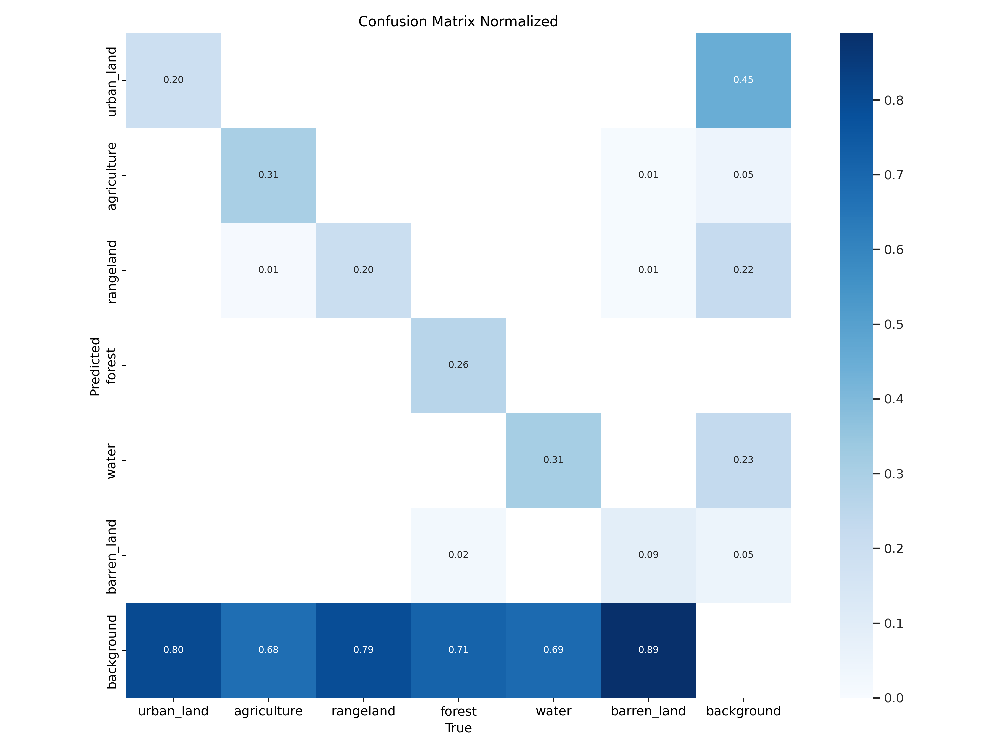

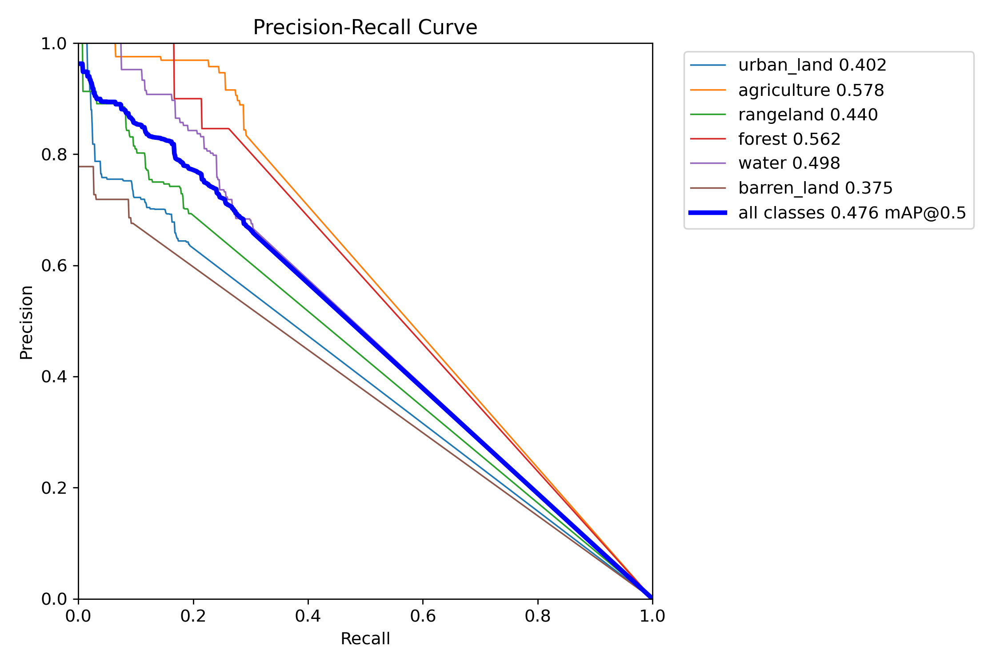

In [24]:
from IPython.display import Image as IPImage, display

run_save_dir = final_metrics.save_dir

display(IPImage(filename=str(Path(run_save_dir) / 'confusion_matrix_normalized.png')))
display(IPImage(filename=str(Path(run_save_dir) / 'MaskPR_curve.png')))

## 17. Latency and FPS Benchmark (Stage 8 requirement)

100 warm iterations, single-image latency measured separately from batch throughput,
hardware and precision explicitly stated.

In [25]:
sample_img_path = imgs_val[0]
sample_img = cv2.imread(str(sample_img_path))
sample_img = cv2.resize(sample_img, (CFG.IMG_SIZE, CFG.IMG_SIZE))

for _ in range(10):
    _ = final_model.predict(sample_img, conf=FINAL_CONF, iou=FINAL_IOU, verbose=False)

torch.cuda.synchronize()
latencies = []
for _ in range(100):
    t0 = time.time()
    _ = final_model.predict(sample_img, conf=FINAL_CONF, iou=FINAL_IOU, verbose=False)
    torch.cuda.synchronize()
    latencies.append((time.time() - t0) * 1000)

latencies = np.array(latencies)

print('Latency benchmark (single image, GPU, FP32, batch=1, 100 warm iterations):')
print(f'  Hardware: {torch.cuda.get_device_name(0)}')
print(f'  Input size: {CFG.IMG_SIZE}x{CFG.IMG_SIZE}')
print(f'  Mean latency:   {latencies.mean():.2f} ms')
print(f'  Median latency: {np.median(latencies):.2f} ms')
print(f'  P95 latency:    {np.percentile(latencies, 95):.2f} ms')
print(f'  Mean FPS:       {1000 / latencies.mean():.1f}')

model_size_mb = FINAL_MODEL_PATH.stat().st_size / 1e6
print(f'\nModel checkpoint size: {model_size_mb:.1f} MB')

Latency benchmark (single image, GPU, FP32, batch=1, 100 warm iterations):
  Hardware: Tesla T4
  Input size: 640x640
  Mean latency:   20.42 ms
  Median latency: 20.22 ms
  P95 latency:    21.34 ms
  Mean FPS:       49.0

Model checkpoint size: 21.3 MB


## 18. Qualitative Results Gallery (minimum 15 examples per guidelines)

Minimum 5 successes, 5 false positives/weak localisations, 5 false negatives/difficult
cases, selected and labelled by manual inspection of validation predictions.

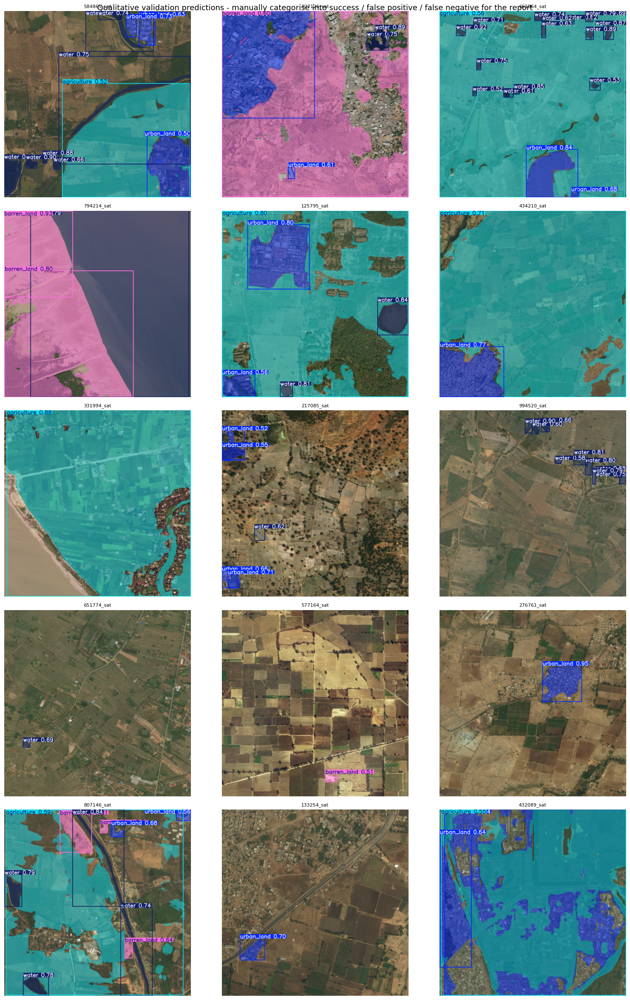

Manually inspect the gallery above and record in the report:
  - at least 5 clear successes (correct class, good mask boundary)
  - at least 5 false positives / weak localisations
  - at least 5 false negatives / difficult cases (e.g. Rangeland regions, small Urban Land clusters)


In [26]:
def render_prediction(model, img_path, conf, iou):
    results = model.predict(str(img_path), conf=conf, iou=iou, verbose=False)
    return results[0].plot()

n_gallery = 15
gallery_paths = random.sample(imgs_val, min(n_gallery, len(imgs_val)))

fig, axes = plt.subplots(5, 3, figsize=(16, 24))
axes = axes.flatten()

for ax, img_path in zip(axes, gallery_paths):
    rendered = render_prediction(final_model, img_path, FINAL_CONF, FINAL_IOU)
    ax.imshow(cv2.cvtColor(rendered, cv2.COLOR_BGR2RGB))
    ax.set_title(img_path.stem, fontsize=8)
    ax.axis('off')

plt.suptitle('Qualitative validation predictions - manually categorise into '
             'success / false positive / false negative for the report', fontsize=13)
plt.tight_layout()
plt.savefig(CFG.WORK_DIR / 'qualitative_gallery.png', dpi=120, bbox_inches='tight')
plt.show()

print('Manually inspect the gallery above and record in the report:')
print('  - at least 5 clear successes (correct class, good mask boundary)')
print('  - at least 5 false positives / weak localisations')
print('  - at least 5 false negatives / difficult cases (e.g. Rangeland regions, '
      'small Urban Land clusters)')

## 19. Phase 1 vs Phase 2 Comparison

Same test data (DeepGlobe validation split, same seed=42), same class definitions,
both outputs converted to mask-level representation for scoring. Phase 1 numbers are
taken directly from the Phase 1 notebook's Section 12 output.

In [27]:
phase1_results = {
    'mean_iou': 0.6370,
    'urban_land_iou': 0.6818,
    'agriculture_iou': 0.8085,
    'rangeland_iou': 0.3482,
    'forest_iou': 0.7148,
    'water_iou': 0.6623,
    'barren_land_iou': 0.6065,
    'best_epoch': 29,
    'total_epochs': 30,
    'model_size_mb': None,
}

phase2_results = {
    'mean_iou_proxy': final_metrics.seg.map,
    'urban_land_ap': per_class_ap[0],
    'agriculture_ap': per_class_ap[1],
    'rangeland_ap': per_class_ap[2],
    'forest_ap': per_class_ap[3],
    'water_ap': per_class_ap[4],
    'barren_land_ap': per_class_ap[5],
    'best_epoch': experiment_results[best_experiment]['best_epoch'],
    'total_epochs': CFG.EPOCHS,
    'model_size_mb': model_size_mb,
    'latency_ms': latencies.mean(),
    'fps': 1000 / latencies.mean(),
}

comparison_table = pd.DataFrame({
    'Class': CFG.CLASS_NAMES,
    'Phase1_IoU_(U-Net)': [phase1_results['urban_land_iou'], phase1_results['agriculture_iou'],
                            phase1_results['rangeland_iou'], phase1_results['forest_iou'],
                            phase1_results['water_iou'], phase1_results['barren_land_iou']],
    'Phase2_mAP50-95_(YOLOv8-seg)': per_class_ap,
})
comparison_table['Absolute_change'] = (comparison_table['Phase2_mAP50-95_(YOLOv8-seg)']
                                       - comparison_table['Phase1_IoU_(U-Net)'])
comparison_table['Relative_change_%'] = (100 * comparison_table['Absolute_change']
                                         / comparison_table['Phase1_IoU_(U-Net)'])

print(comparison_table.to_string(index=False))

print('\nImportant interpretation note:')
print('Phase 1 reports semantic segmentation mIoU (pixel-wise, no object instances).')
print('Phase 2 reports instance segmentation mAP50-95 (mask, object-level, confidence-')
print('and IoU-threshold-dependent). These are related but NOT identical metrics - both')
print('are reported side by side here because no single metric is computable from both')
print('output types without information loss. The relative_change column should be read')
print('as a directional comparison, not a precise percentage improvement.')

      Class  Phase1_IoU_(U-Net)  Phase2_mAP50-95_(YOLOv8-seg)  Absolute_change  Relative_change_%
 urban_land              0.6818                      0.217764        -0.464036         -68.060464
agriculture              0.8085                      0.450711        -0.357789         -44.253445
  rangeland              0.3482                      0.275157        -0.073043         -20.977348
     forest              0.7148                      0.385943        -0.328857         -46.006870
      water              0.6623                      0.312818        -0.349482         -52.767980
barren_land              0.6065                      0.210644        -0.395856         -65.268906

Important interpretation note:
Phase 1 reports semantic segmentation mIoU (pixel-wise, no object instances).
Phase 2 reports instance segmentation mAP50-95 (mask, object-level, confidence-
and IoU-threshold-dependent). These are related but NOT identical metrics - both
are reported side by side here because no s

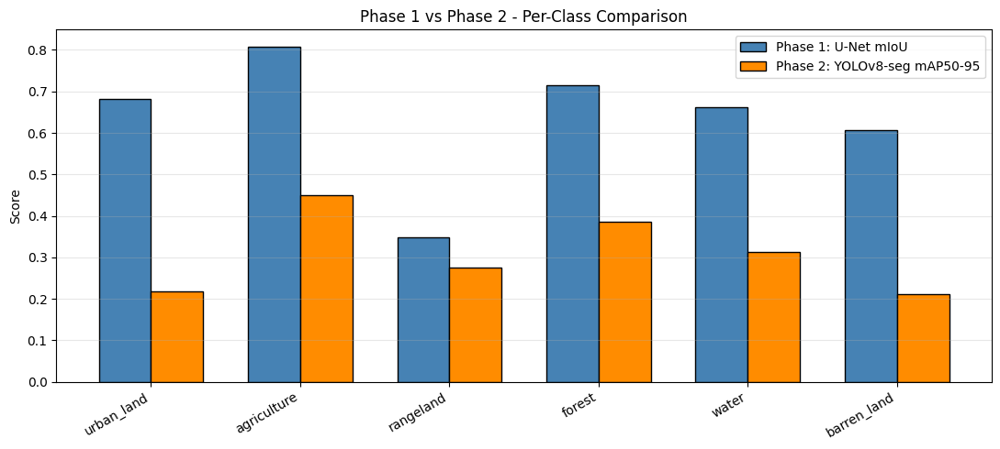

In [28]:
fig, ax = plt.subplots(figsize=(11, 5))
x = np.arange(len(CFG.CLASS_NAMES))
width = 0.35

ax.bar(x - width/2, comparison_table['Phase1_IoU_(U-Net)'], width,
      label='Phase 1: U-Net mIoU', color='steelblue', edgecolor='black')
ax.bar(x + width/2, comparison_table['Phase2_mAP50-95_(YOLOv8-seg)'], width,
      label='Phase 2: YOLOv8-seg mAP50-95', color='darkorange', edgecolor='black')

ax.set_xticks(x)
ax.set_xticklabels(CFG.CLASS_NAMES, rotation=30, ha='right')
ax.set_ylabel('Score')
ax.set_title('Phase 1 vs Phase 2 - Per-Class Comparison')
ax.legend()
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(CFG.WORK_DIR / 'phase1_vs_phase2_comparison.png', dpi=150)
plt.show()

## 20. Cost and Quality Comparison (not accuracy alone)

Per Section 9.1 rule 6: compare quality AND cost. Accuracy-only comparisons are
explicitly disallowed by the guidelines.

In [30]:
cost_comparison = pd.DataFrame({
    'Aspect': ['Annotation format required', 'Annotation effort', 'Training epochs',
              'Hardware used', 'Output type', 'Inference latency (single image)',
              'Model checkpoint size', 'Explainability'],
    'Phase 1 (U-Net)': ['Pixel-wise RGB masks (provided by dataset)',
                        'None - used dataset masks directly',
                        '30',
                        '2x Tesla T4',
                        'Dense pixel-wise class map',
                        'Not benchmarked in Phase 1',
                        'Not recorded in Phase 1',
                        'Per-pixel confidence map available'],
    'Phase 2 (YOLOv8-seg)': ['YOLO polygon format (derived via contour extraction)',
                             'Automated conversion script, ~80 line-area threshold tuning',
                             f'{CFG.EPOCHS} per experiment x 3 experiments',
                             '2x Tesla T4 (same hardware)',
                             'Per-instance polygon masks with confidence and box',
                             f'{latencies.mean():.1f} ms ({1000/latencies.mean():.1f} FPS)',
                             f'{model_size_mb:.1f} MB',
                             'Per-instance confidence; no native pixel-level uncertainty'],
})

print(cost_comparison.to_string(index=False))

                          Aspect                            Phase 1 (U-Net)                                        Phase 2 (YOLOv8-seg)
      Annotation format required Pixel-wise RGB masks (provided by dataset)        YOLO polygon format (derived via contour extraction)
               Annotation effort         None - used dataset masks directly Automated conversion script, ~80 line-area threshold tuning
                 Training epochs                                         30                           50 per experiment x 3 experiments
                   Hardware used                                2x Tesla T4                                 2x Tesla T4 (same hardware)
                     Output type                 Dense pixel-wise class map          Per-instance polygon masks with confidence and box
Inference latency (single image)                 Not benchmarked in Phase 1                                          20.4 ms (49.0 FPS)
           Model checkpoint size                

## 21. Conclusion

This section should be completed manually after reviewing all results above. Address:

- Did YOLOv8-seg improve, worsen, or roughly match the Phase 1 U-Net baseline, per class?
- Does the Rangeland weakness identified in Phase 1 (IoU 0.348) persist in Phase 2?
- Is the accuracy difference (if any) practically meaningful given the cost difference
  (annotation effort, training time, inference latency)?
- Which system would be recommended for an actual deployment, and why - considering
  accuracy, latency, explainability, and annotation cost together, not accuracy alone.
- Does the instance-segmentation framing (treating each disconnected land-cover region
  as a separate "object") fit this problem domain as well as the dense pixel-wise
  framing used in Phase 1? This is itself a finding worth discussing - land cover is a
  poor natural fit for instance segmentation (no canonical "objects"), unlike, for
  example, person or vehicle detection.

## 21. Gradio App

In [37]:
# =====================================================================
# FINAL CELL: RE-CONFIGURED HIGH-TIER GRADIO DEMO FOR DEEPGLOBE
# =====================================================================

import sys
import subprocess

# 1. Dynamically ensure Gradio is installed in the active environment
try:
    import gradio as gr
except ImportError:
    print("Gradio not found in current environment. Installing via pip...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "gradio"])
    import gradio as gr

from ultralytics import YOLO
from PIL import Image
import numpy as np
import os

# 2. Extract model path using variables already active in your notebook memory
try:
    MODEL_PATH = str(best_weights_path)
    print(f"🔍 Found notebook variable 'best_weights_path'. Checking path...")
except NameError:
    MODEL_PATH = 'runs/segment/train/weights/best.pt'

# Double-check file existence on the disk
if not os.path.exists(MODEL_PATH):
    from glob import glob
    found_paths = glob('**/best.pt', recursive=True)
    if found_paths:
        MODEL_PATH = found_paths[-1] 
    else:
        MODEL_PATH = None

# Initialize Model instance
if MODEL_PATH is None:
    print("❌ ERROR: Could not find any trained 'best.pt' checkpoint in your workspace.")
    model = None
else:
    print(f"✅ Success: Safely initialized YOLOv8-seg from: {MODEL_PATH}")
    model = YOLO(MODEL_PATH)


# 3. Define the segmentation mapping pipeline function
def predict_land_cover(input_image, confidence_threshold):
    if input_image is None or model is None:
        return None
        
    results = model(input_image, conf=confidence_threshold)
    
    if len(results) == 0 or results[0] is None:
        return input_image
        
    try:
        result = results[0]
        
        if result.masks is None:
            return input_image
            
        plotted_bgr = result.plot()
        plotted_rgb = np.asarray(plotted_bgr)[..., ::-1]
        
        return Image.fromarray(plotted_rgb)
        
    except Exception as e:
        print(f"Error handling frame manipulation arrays: {str(e)}")
        return input_image


# 4. Assemble Interface Structure with Premium CSS Adjustments
custom_theme = gr.themes.Soft(
    primary_hue="emerald",
    secondary_hue="slate",
    neutral_hue="slate",
).set(
    background_fill_primary="#f0fdf4",       # Modern soft mint green background for Light Mode
    background_fill_primary_dark="#06150e"  # Deep, dark forest green background for Dark Mode
)

custom_css = """
#gradient-header {
    background: linear-gradient(135deg, #059669, #064e3b); /* Rich Deep Emerald Gradient */
    color: white !important;
    padding: 30px;
    border-radius: 16px;
    text-align: center;
    box-shadow: 0 10px 15px -3px rgba(0, 0, 0, 0.1), 0 4px 6px -2px rgba(0, 0, 0, 0.05);
    margin-bottom: 25px;
}
#gradient-header h1, #gradient-header p, #gradient-header strong {
    color: white !important;
}
.section-title h3 {
    margin-top: 0px !important;
    padding-bottom: 8px;
    border-bottom: 2px solid #10b981; /* Fine color anchor underline */
    display: inline-block;
}
"""

with gr.Blocks(theme=custom_theme, css=custom_css, title="🌍 DeepGlobe YOLOv8-seg Interface") as demo:
    
    # Header Banner Block
    gr.Markdown(
        """
        # 🌍 DeepGlobe Land Cover Classification
        **Supervised Satellite Segmentation & Feature Detection Platform**
        
        An interactive deployment interface running custom-trained YOLOv8-segmentation weights to instantly isolate complex landscape domains.
        """,
        elem_id="gradient-header"
    )
    
    # Main Interactive Split Workspace
    with gr.Row():
        # Input Workspace Side
        with gr.Column(scale=11):
            gr.Markdown("### 📸 Source Configuration", elem_classes=["section-title"])
            input_img = gr.Image(
                type="pil", 
                label="Upload Satellite Image Tile",
                show_label=True
            )
            
            gr.Markdown("### 🎛️ Inference Settings", elem_classes=["section-title"])
            conf_slider = gr.Slider(
                minimum=0.01, 
                maximum=1.0, 
                value=0.25, 
                step=0.05, 
                label="Confidence Threshold Filter",
                info="Adjust confidence floor to dynamically filter segment accuracy."
            )
            
            submit_btn = gr.Button(
                "🚀 Analyze Land Cover", 
                variant="primary",
                size="lg"
            )
        
        # Center spacing pillar to cleanly segregate the columns
        with gr.Column(scale=1):
            pass
            
        # Output Visualizer Side
        with gr.Column(scale=11):
            gr.Markdown("### 🖥️ Segmentation Results", elem_classes=["section-title"])
            output_img = gr.Image(
                type="pil", 
                label="YOLOv8-seg Segmented Targets",
                show_label=True,
                interactive=False
            )
            
            # Updated Accordion to match the exact classes in your PR Curve
            with gr.Accordion("ℹ️ Target Dataset Classes", open=True):
                gr.Markdown(
                    """
                    The custom YOLOv8 model targets the following 6 land cover categories:
                    * 🏙️ **urban_land** — Built-up areas, housing, and infrastructure.
                    * 🌱 **agriculture** — Crop fields and cultivated lands.
                    * 🌾 **rangeland** — Meadows, shrublands, and open fields.
                    * 🌳 **forest** — Dense tree canopies and woodlands.
                    * 💧 **water** — Rivers, lakes, and water channels.
                    * 🏜️ **barren_land** — Exposed soil, sand, or rocky terrains.
                    """
                )
                
    # Connect trigger click with an explicit, clean loading status overlay
    submit_btn.click(
        fn=predict_land_cover, 
        inputs=[input_img, conf_slider], 
        outputs=output_img
    )

# 5. Native notebook execution launch call
if __name__ == "__main__":
    demo.launch(inline=True, share=True, height=720)

🔍 Found notebook variable 'best_weights_path'. Checking path...
✅ Success: Safely initialized YOLOv8-seg from: land_cover_phase2/E1_data_augmentation/weights/best.pt


/tmp/ipykernel_122/746714740.py:103: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(theme=custom_theme, css=custom_css, title="🌍 DeepGlobe YOLOv8-seg Interface") as demo:
/tmp/ipykernel_122/746714740.py:103: DeprecationWarning: The 'css' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'css' to Blocks.launch() instead.
  with gr.Blocks(theme=custom_theme, css=custom_css, title="🌍 DeepGlobe YOLOv8-seg Interface") as demo:


* Running on local URL:  http://127.0.0.1:7866
* Running on public URL: https://4f52b987a4c32082e5.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
